In [1]:
import pandas as pd
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Data preprocessing


In [6]:
#load all studies
files = ['Study_A.csv','Study_B.csv','Study_C.csv','Study_D.csv','Study_E.csv']
trials = []
for file in files:
    trials.append(pd.read_csv(file))
train_data= pd.concat(trials, sort = False)

#Factorize the TxGroup (make control/Treatment to 0/1)
train_data['TxGroup'] = pd.factorize(train_data.TxGroup)[0]

#sort the data by patient and visits
train_data = train_data.sort_values(['PatientID', 'VisitDay'], ascending=[True, True]).reset_index().drop(['index'],axis=1)

#Get sum of Ps,Ns,Gs
#get sum of Ps,Ns,Gs
Ps=['P1', 'P2', 'P3', 'P4', 'P5','P6', 'P7']
Gs=['G1','G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12', 'G13', 'G14', 'G15','G16']
Ns=['N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7']
train_data['Ps'] = train_data[Ps].sum(axis=1)
train_data['Gs'] = train_data[Gs].sum(axis=1)
train_data['Ns'] = train_data[Ns].sum(axis=1)

#diff of PANSS_Total
train_data['PANSS_Total_diff_1'] = train_data.groupby('PatientID')['PANSS_Total'].diff()
#(diff() function: first discrete difference of objects over the given axis)

In [7]:
#@title Visualize the Data : Are there missing/unexpected feature values? What kind of variables we have?
from facets_overview.generic_feature_statistics_generator import GenericFeatureStatisticsGenerator
import base64

gfsg = GenericFeatureStatisticsGenerator()
proto = gfsg.ProtoFromDataFrames([{'name': 'train', 'table': train_data}])
protostr = base64.b64encode(proto.SerializeToString()).decode("utf-8")


from IPython.core.display import display, HTML

HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html" >
        <facets-overview id="elem"></facets-overview>
        <script>
          document.querySelector("#elem").protoInput = "{protostr}";
        </script>"""
html = HTML_TEMPLATE.format(protostr=protostr)
display(HTML(html))

1. We can see from reviewing the "missing" column that the following features contain missing value:

*   VisitDay
*   LeadStatus

2. Country label has some errors - need to fix it

3. Study C patient number is higher than other studies

In [ ]:
#@title Visualize the Data
# Display the Dive visualization.
from IPython.core.display import display, HTML

jsonstr = train_data.to_json(orient='records')
HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html">
        <facets-dive id="elem" height="600"></facets-dive>
        <script>
          var data = {jsonstr};
          document.querySelector("#elem").data = data;
        </script>"""
html = HTML_TEMPLATE.format(jsonstr=jsonstr)
display(HTML(html))

1. In the **Binning | X-Axis** menu, select **PANSS_Total**, and in the **Color By** and  **Label By** menus, select **Country**. 

We oberved there are "other" country label --> need to know what's wrong with that data.

In higher PANSS_total (>100), argintina become the major group.  This indicates that we may have country bias on the disease score.

2. In the **Binning | X-Axis** menu, select **PANSS_Total**, and in the **Color By** and  **Label By** menus, select **Study**.

In higher PANSS_total (>100), argintina is studyA is the major group.

3. In the **Binning | X-Axis** menu, select **PANSS_Total**, and in the **Color By** and  **Label By** menus, select **LeadStatus**.

We have missing leadstatus when PANS

In [ ]:
#Original analysis

# Does the control/treament will affect the disease socre over time?

#formaula: PANSS = 

formula = "PANSS_Total_diff_1 ~ VisitDay + TxGroup + TxGroup:VisitDay"
olsModel = smf.ols(formula,data=train_data).fit()
print(olsModel.summary())

                            OLS Regression Results                            
Dep. Variable:     PANSS_Total_diff_1   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     155.7
Date:                Sat, 31 Oct 2020   Prob (F-statistic):          8.91e-100
Time:                        21:22:03   Log-Likelihood:                -68247.
No. Observations:               19962   AIC:                         1.365e+05
Df Residuals:                   19958   BIC:                         1.365e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           -3.6212      0.110  

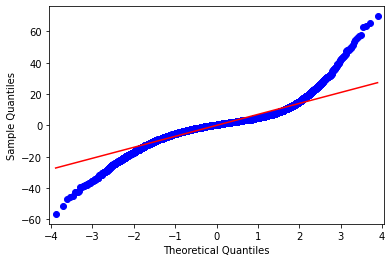

In [ ]:
qq = sm.qqplot(olsModel.resid, line = 'r')

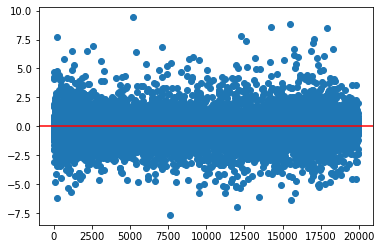

In [ ]:
stdres = pd.DataFrame(olsModel.resid_pearson)
plt.plot(stdres, 'o', ls = 'None')
l = plt.axhline(y=0, color = 'r')
 

# Does different country will affect the PANSS score overtime?


# Does differemt trial (different patient population) will affect the PANSS score overtime?


In [ ]:
train_data['Study'] = pd.Categorical(train_data['Study'])

formula = "PANSS_Total_diff_1 ~ VisitDay + Study + Study*VisitDay"
olsModel = smf.ols(formula,data=train_data).fit()
print(olsModel.summary())

                            OLS Regression Results                            
Dep. Variable:     PANSS_Total_diff_1   R-squared:                       0.030
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     69.64
Date:                Sat, 31 Oct 2020   Prob (F-statistic):          4.15e-127
Time:                        01:26:14   Log-Likelihood:                -68169.
No. Observations:               19962   AIC:                         1.364e+05
Df Residuals:                   19952   BIC:                         1.364e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              -3.0931    

In [ ]:
train_data = train_data.copy()
train_data_onehot = pd.get_dummies(train_data, columns=['Study'], prefix = ['carrier'])
train_data_onehot_txgroup0 = train_data_onehot[train_data_onehot['TxGroup'] == 0]
train_data_onehot_txgroup1 = train_data_onehot[train_data_onehot['TxGroup'] == 1]

In [ ]:
formula = "PANSS_Total_diff_1 ~ VisitDay + TxGroup + TxGroup:VisitDay + Study + Study*VisitDay"
olsModel = smf.ols(formula,data=train_data).fit()
print(olsModel.summary())

                            OLS Regression Results                            
Dep. Variable:     PANSS_Total_diff_1   R-squared:                       0.030
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     56.99
Date:                Sat, 31 Oct 2020   Prob (F-statistic):          2.74e-125
Time:                        21:30:08   Log-Likelihood:                -68169.
No. Observations:               19962   AIC:                         1.364e+05
Df Residuals:                   19950   BIC:                         1.365e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              -3.0969    

1. considering mulitiple testing (studyA to studyE), we set up the alpah = 0.01
2. StudyD and StudyE have p vlaue < 0.001 --> different trials- different patint population affects the PANSS score over time.

--> Different trials (patients are from different country), may be because of different patient population lead to different PANSS over time.

Adding studD and study E into the analysis



#Adding StudyD and E variable into the analysis




In [ ]:
train_data['Study'] = pd.Categorical(train_data['Study'])

formula = "PANSS_Total_diff_1 ~ VisitDay + Study + Study*VisitDay"
olsModel = smf.ols(formula,data=train_data).fit()
print(olsModel.summary())

In [ ]:
train_data['Country'] = pd.Categorical(train_data['Country'])

formula = "PANSS_Total_diff_1 ~ VisitDay + Country + Country*VisitDay"
olsModel = smf.ols(formula,data=train_data).fit()
print(olsModel.summary())

                            OLS Regression Results                            
Dep. Variable:     PANSS_Total_diff_1   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     11.35
Date:                Sat, 31 Oct 2020   Prob (F-statistic):           4.38e-99
Time:                        21:34:22   Log-Likelihood:                -68159.
No. Observations:               19962   AIC:                         1.364e+05
Df Residuals:                   19904   BIC:                         1.369e+05
Df Model:                          57                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Inte

In [ ]:
train_data['Country'] = pd.Categorical(train_data['Country'])

formula = "PANSS_Total_diff_1 ~ VisitDay + Country + Country*VisitDay + TxGroup + TxGroup:VisitDay"
olsModel = smf.ols(formula,data=train_data).fit()
print(olsModel.summary())

                            OLS Regression Results                            
Dep. Variable:     PANSS_Total_diff_1   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     10.97
Date:                Sat, 31 Oct 2020   Prob (F-statistic):           4.91e-98
Time:                        21:37:09   Log-Likelihood:                -68159.
No. Observations:               19962   AIC:                         1.364e+05
Df Residuals:                   19902   BIC:                         1.369e+05
Df Model:                          59                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Inte